# ML and TabPFN

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
import lightgbm as lgb
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV
from sklearn.calibration import calibration_curve
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import joblib
from tabpfn import TabPFNClassifier

In [6]:
train = pd.read_excel("train.xlsx")
test = pd.read_excel("test.xlsx")

x_train = train.drop(['Group'], axis=1)
y_train = train['Group']
x_val = test.drop(['Group'], axis=1)
y_val = test['Group']

In [7]:
model_pipelines = {
    'tabpfn': Pipeline([('tabpfn', TabPFNClassifier())]),  
    'rf': Pipeline([('rf', RandomForestClassifier())]),
    'gbc': Pipeline([('gbc', GradientBoostingClassifier())]),
    'abc': Pipeline([('abc', AdaBoostClassifier())]),
    'xgb': Pipeline([('xgb', XGBClassifier())]),
    'lgb': Pipeline([('lgb', lgb.LGBMClassifier())]),
}

# 更新参数网格
param_grids = {
    'tabpfn': {},  
    'rf': { 
        'rf__max_depth': [2, 3],
        'rf__n_estimators': [50, 100],
        'rf__min_samples_split': [10, 15],
        'rf__min_samples_leaf': [5, 10],
        'rf__max_features': [0.3, 0.5],
        'rf__bootstrap': [True],
    },
    'gbc': {
        'gbc__n_estimators': [500, 1000],
        'gbc__learning_rate': [0.001, 0.005],
        'gbc__max_depth': [2, 3],
        'gbc__min_samples_split': [15, 20],
        'gbc__min_samples_leaf': [6, 8],
        'gbc__subsample': [0.6, 0.7],
    },
    'abc': {
        'abc__n_estimators': [50, 100, 200],
        'abc__learning_rate': [0.01, 0.05],
    },
    'xgb': {
        'xgb__n_estimators': [500, 1000],
        'xgb__learning_rate': [0.01, 0.005],
        'xgb__max_depth': [2, 3],
        'xgb__subsample': [0.5],
        'xgb__colsample_bytree': [0.3],
        'xgb__reg_alpha': [0.1, 1],
        'xgb__reg_lambda': [1, 10],
        'xgb__gamma': [0.5, 1],
    },
    'lgb': {
        'lgb__n_estimators': [500, 1000],
        'lgb__max_depth': [3, 2],
        'lgb__learning_rate': [0.01, 0.005],
        'lgb__num_leaves': [20, 30],
        'lgb__subsample': [0.5],
        'lgb__colsample_bytree': [0.3],
        'lgb__reg_alpha': [0, 0.1],
        'lgb__reg_lambda': [0, 0.1],
    },
}

# %% [markdown]
# # 模型构建性能预测（修改训练逻辑）

# %%
import os
os.makedirs("model", exist_ok=True)

results = {}
roc_curves = {}
calibration_curves = {}
dca_curves = {}
train_results = {}
val_results = {}

for model_name, pipeline in model_pipelines.items():
    print(f"Processing model: {model_name}")
    param_grid = param_grids[model_name]
    
    # 区分处理带参数搜索的模型和TabPFN
    if param_grid:
        # 原有参数搜索逻辑
        random_search = RandomizedSearchCV(
            pipeline,
            param_distributions=param_grid,
            n_iter=50,
            verbose=1,
            cv=5,
            n_jobs=-1,
            scoring='roc_auc'
        )
        random_search.fit(x_train, y_train)
        best_model = random_search.best_estimator_
    else:
        # TabPFN直接训练
        pipeline.fit(x_train, y_train)
        best_model = pipeline
    
    # 保存模型
    model_filename = os.path.join("model", f"{model_name}_best_model.pkl")
    joblib.dump(best_model, model_filename)
    
    # 预测概率
    y_train_proba = best_model.predict_proba(x_train)[:, 1]
    y_val_proba = best_model.predict_proba(x_val)[:, 1]

    # 存储结果
    train_results[model_name] = pd.DataFrame({
        'y_train': y_train,
        'y_train_proba': y_train_proba
    })
    val_results[model_name] = pd.DataFrame({
        'y_val': y_val,
        'y_val_proba': y_val_proba
    })

    # ROC曲线数据
    fpr_train, tpr_train, _ = roc_curve(y_train, y_train_proba)
    fpr_val, tpr_val, _ = roc_curve(y_val, y_val_proba)
    roc_curves[model_name] = {
        'train': (fpr_train, tpr_train, roc_auc_score(y_train, y_train_proba)),
        'val': (fpr_val, tpr_val, roc_auc_score(y_val, y_val_proba))
    }

Processing model: tabpfn
Processing model: rf
Fitting 5 folds for each of 32 candidates, totalling 160 fits


/opt/miniconda3/envs/py310/lib/python3.10/site-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 32 is smaller than n_iter=50. Running 32 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Processing model: gbc
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Processing model: abc
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/opt/miniconda3/envs/py310/lib/python3.10/site-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 6 is smaller than n_iter=50. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Processing model: xgb
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Processing model: lgb
Fitting 5 folds for each of 50 candidates, totalling 250 fits
[LightGBM] [Info] Number of positive: 72, number of negative: 101
[LightGBM] [Info] Number of positive: 73, number of negative: 100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 312
[LightGBM] [Info] Number of data points in the train set: 173, number of used features: 8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 302
[LightGBM] [Info] Number of data points in the train set: 173, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.416185 -> initscore=-0.338454
[LightGBM] [Info] Start training from score -0.338

In [8]:
# 创建一个DataFrame来存储所有模型的预测概率
# 第一列是真实标签（y_train 或 y_val），其他列是每个模型的预测概率
all_train_results = pd.DataFrame({'y_train': y_train})
all_val_results = pd.DataFrame({'y_val': y_val})

# 将每个模型的预测概率添加到DataFrame中
for model_name, df in train_results.items():
    all_train_results[f'{model_name}_proba'] = df['y_train_proba']

for model_name, df in val_results.items():
    all_val_results[f'{model_name}_proba'] = df['y_val_proba']

# 导出合并后的DataFrame到CSV文件
all_train_results.to_csv("all_train_results.csv", index=False)
all_val_results.to_csv("all_val_results.csv", index=False)

print("All train results have been saved to 'all_train_results.csv'")
print("All validation results have been saved to 'all_val_results.csv'")

All train results have been saved to 'all_train_results.csv'
All validation results have been saved to 'all_val_results.csv'


# ROC绘制

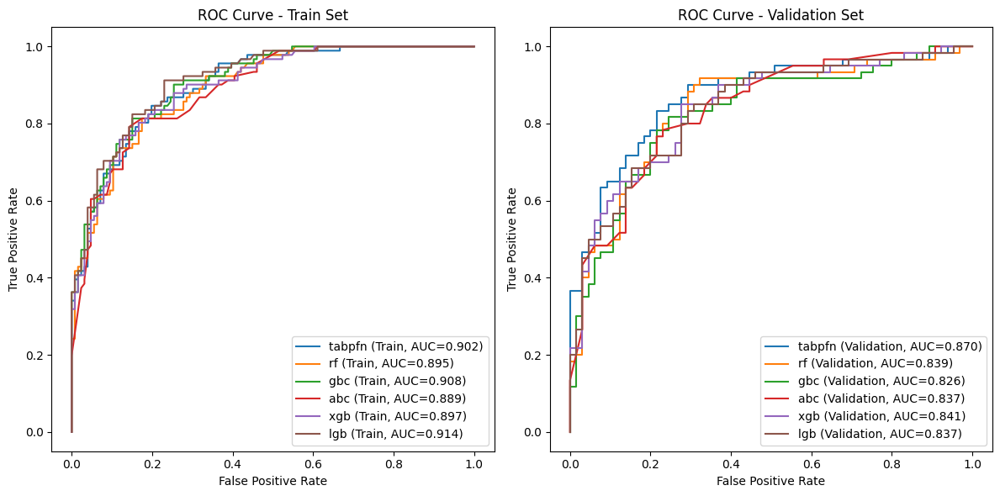

In [9]:
# Plot ROC curves for train and validation sets
plt.figure(figsize=(12, 6))

# Train set ROC curves
plt.subplot(1, 2, 1)
for model_name, curves in roc_curves.items():
    fpr, tpr, auc = curves['train']
    plt.plot(fpr, tpr, label=f"{model_name} (Train, AUC={auc:.3f})")
plt.title("ROC Curve - Train Set")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()

# Validation set ROC curves
plt.subplot(1, 2, 2)
for model_name, curves in roc_curves.items():
    fpr, tpr, auc = curves['val']
    plt.plot(fpr, tpr, label=f"{model_name} (Validation, AUC={auc:.3f})")
plt.title("ROC Curve - Validation Set")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()

plt.tight_layout()
plt.savefig("roc_curves_with_auc.pdf")
plt.show()